In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/README.dataset.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/README.roboflow.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/data.yaml
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/split.py
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_1394_jpg.rf.7b97ce09eb15862943c90a0a22c56b52.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_38120_jpg.rf.b8d4831d16a6efedfb3f60d010694a01.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_11414_jpg.rf.80c0f550ca9ba4ebb29efc6ee40abb7f.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_21680_jpg.rf.4cc292033b9c17dae61cdf83c4c8a652.txt
/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels/img_17995_jpg.rf.d7f4f79f30ab2aa6f35a8da79df65dc9.txt
/kaggle/input/distracted-driving/Distracte

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.7/914.7 kB 17.3 MB/s eta 0:00:00a 0:00:01


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


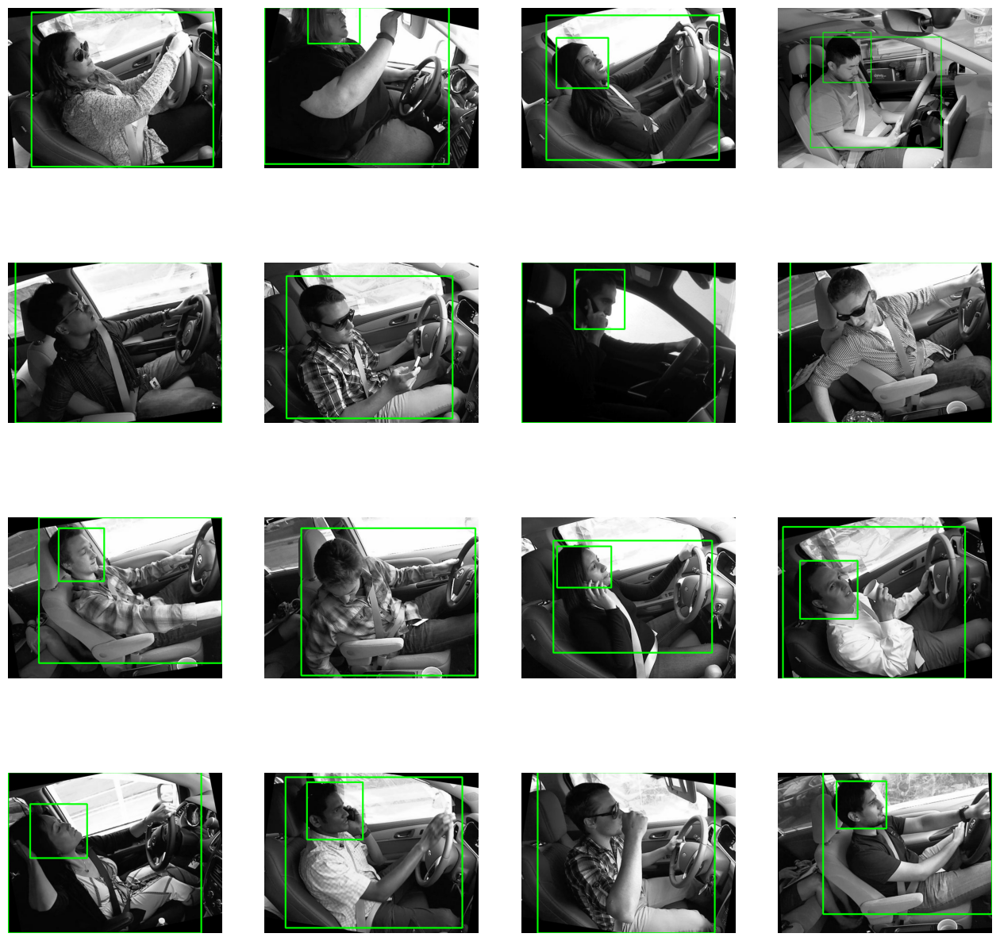

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/images"
train_labels = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/labels"

test_images = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test/images"
test_labels = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/labels"

val_images = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/images"
val_labels = "/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/images/00992906-254F-4182-97B7-C9FF20CF69FE_jpeg.rf.221cb40b49fd2bf5c08adb9ee124415c.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 1280x958 and 3 channels.


In [6]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolov10l.pt")

100%|██████████| 50.0M/50.0M [00:00<00:00, 171MB/s]


In [7]:
# Define the path where you want to save the data.yaml file
yaml_file_path = '/kaggle/working/data.yaml'

# Write the content to the YAML file
with open(yaml_file_path, 'w') as f:
    f.write("""# Dataset Configuration
Path: /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11
train: /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/images
val: /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/images
test: /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test/images
nc: 12
names: ['c0 - Safe Driving', 'c1 - Texting', 'c2 - Talking on the phone', 'c3 - Operating the Radio', 
        'c4 - Drinking', 'c5 - Reaching Behind', 'c6 - Hair and Makeup', 'c7 - Talking to Passenger', 
        'd0 - Eyes Closed', 'd1 - Yawning', 'd2 - Nodding Off', 'd3 - Eyes Open']

roboflow:
  workspace: flytech
  project: distracted-driving-v2wk5-f5vtj
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/flytech/distracted-driving-v2wk5-f5vtj/dataset/1
""")


In [8]:
import torch

# Free up GPU memory
torch.cuda.empty_cache()

# Train the model with specified optimizer and learning rate
model.train(
    data='/kaggle/working/data.yaml',  
    epochs=25,
    imgsz=640,                                  
    device='0',                       
    optimizer='SGD',  # Choose an optimizer (e.g., SGD or Adam)
    lr0=0.01,       # Set initial learning rate
)

Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov10l.pt, data=/kaggle/working/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tru

100%|██████████| 755k/755k [00:00<00:00, 17.2MB/s]


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1    137728  ultralytics.nn.modules.block.SCDown          [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1    268800  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 73.4MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train/labels... 17909 images, 0 backgrounds, 0 corrupt: 100%|██████████| 17909/17909 [00:45<00:00, 392.61it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.4 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val/labels... 2238 images, 1 backgrounds, 0 corrupt: 100%|██████████| 2238/2238 [00:05<00:00, 388.62it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/val is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 167 weight(decay=0.0), 180 weight(decay=0.0005), 179 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      13.9G      2.094      3.358      2.998         22        640: 100%|██████████| 1120/1120 [17:08<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:40<00:00,  1.74it/s]

                   all       2238       3813      0.812      0.895      0.912      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      13.7G      1.962      1.924      2.766         18        640: 100%|██████████| 1120/1120 [16:55<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813      0.809       0.78       0.87      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      13.7G      2.043      2.004      2.805         26        640: 100%|██████████| 1120/1120 [16:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813      0.819      0.815      0.885      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      13.7G      2.034      1.999      2.794         24        640: 100%|██████████| 1120/1120 [16:46<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813      0.843      0.886       0.93      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      13.8G      1.929      1.794       2.71         17        640: 100%|██████████| 1120/1120 [16:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813      0.867      0.924      0.945      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      13.7G      1.863       1.67       2.66         17        640: 100%|██████████| 1120/1120 [16:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813       0.89      0.933      0.956      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      13.8G      1.815       1.58      2.622         26        640: 100%|██████████| 1120/1120 [16:46<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813      0.908      0.912      0.957      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      13.7G      1.769      1.495      2.581         24        640: 100%|██████████| 1120/1120 [16:46<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.942      0.928      0.966       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      13.7G      1.731      1.438      2.559         22        640: 100%|██████████| 1120/1120 [16:45<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813       0.92      0.928      0.966      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      13.7G      1.703      1.385      2.541         21        640: 100%|██████████| 1120/1120 [16:45<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.942      0.939      0.973      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      13.7G      1.681      1.338      2.522         22        640: 100%|██████████| 1120/1120 [16:45<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.919      0.956      0.971      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      13.7G      1.642      1.289      2.495         24        640: 100%|██████████| 1120/1120 [16:45<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.946      0.957      0.979      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      13.7G      1.628      1.261      2.492         27        640: 100%|██████████| 1120/1120 [16:46<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.957      0.957      0.979       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      13.7G      1.597      1.212      2.467         15        640: 100%|██████████| 1120/1120 [16:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.933      0.961       0.97      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      13.8G      1.588      1.181      2.458         20        640: 100%|██████████| 1120/1120 [16:46<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.943      0.964      0.979      0.818


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      13.7G      1.584     0.7021      2.656          9        640: 100%|██████████| 1120/1120 [16:39<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.942      0.952       0.97      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      13.7G      1.565     0.6795      2.645          9        640: 100%|██████████| 1120/1120 [16:38<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813      0.949      0.966      0.972      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      13.7G      1.538     0.6606      2.622          9        640: 100%|██████████| 1120/1120 [16:39<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.948      0.964      0.975      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      13.7G      1.516     0.6394      2.593          9        640: 100%|██████████| 1120/1120 [16:39<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.961      0.968      0.983       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      13.7G      1.495     0.6135       2.57          9        640: 100%|██████████| 1120/1120 [16:40<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813      0.959       0.96      0.982      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      13.7G      1.468     0.5903      2.546          8        640: 100%|██████████| 1120/1120 [16:42<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813      0.961      0.975      0.985      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      13.7G      1.444     0.5645      2.527         10        640: 100%|██████████| 1120/1120 [16:40<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:39<00:00,  1.79it/s]

                   all       2238       3813      0.963      0.973      0.984      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      13.7G      1.419     0.5438      2.504         10        640: 100%|██████████| 1120/1120 [16:40<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.964      0.975      0.985      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      13.7G      1.391     0.5276      2.483          9        640: 100%|██████████| 1120/1120 [16:40<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.972      0.971      0.985      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      13.7G      1.363      0.506       2.46          8        640: 100%|██████████| 1120/1120 [16:40<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.80it/s]

                   all       2238       3813      0.968      0.975      0.985      0.842



25 epochs completed in 7.275 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10l summary (fused): 461 layers, 25,734,872 parameters, 0 gradients, 126.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 70/70 [00:38<00:00,  1.82it/s]


                   all       2238       3813      0.968      0.975      0.985      0.842
     c0 - Safe Driving        240        240      0.959       0.98      0.986      0.888
          c1 - Texting        268        268      0.989      0.999      0.992       0.92
c2 - Talking on the phone        291        291      0.994      0.997      0.995      0.856
c3 - Operating the Radio        245        245      0.992      0.999      0.989       0.96
         c4 - Drinking        269        269      0.998          1      0.995      0.913
  c5 - Reaching Behind        260        260      0.995          1      0.995      0.922
  c6 - Hair and Makeup        297        297      0.976          1      0.994      0.913
c7 - Talking to Passenger        208        208       0.94      0.947      0.979      0.917
      d0 - Eyes Closed        378        379      0.907      0.901      0.945      0.605
          d1 - Yawning         80         80      0.975      0.978      0.984      0.696
      d2 - No

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 14.2ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e4dea434160>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,  

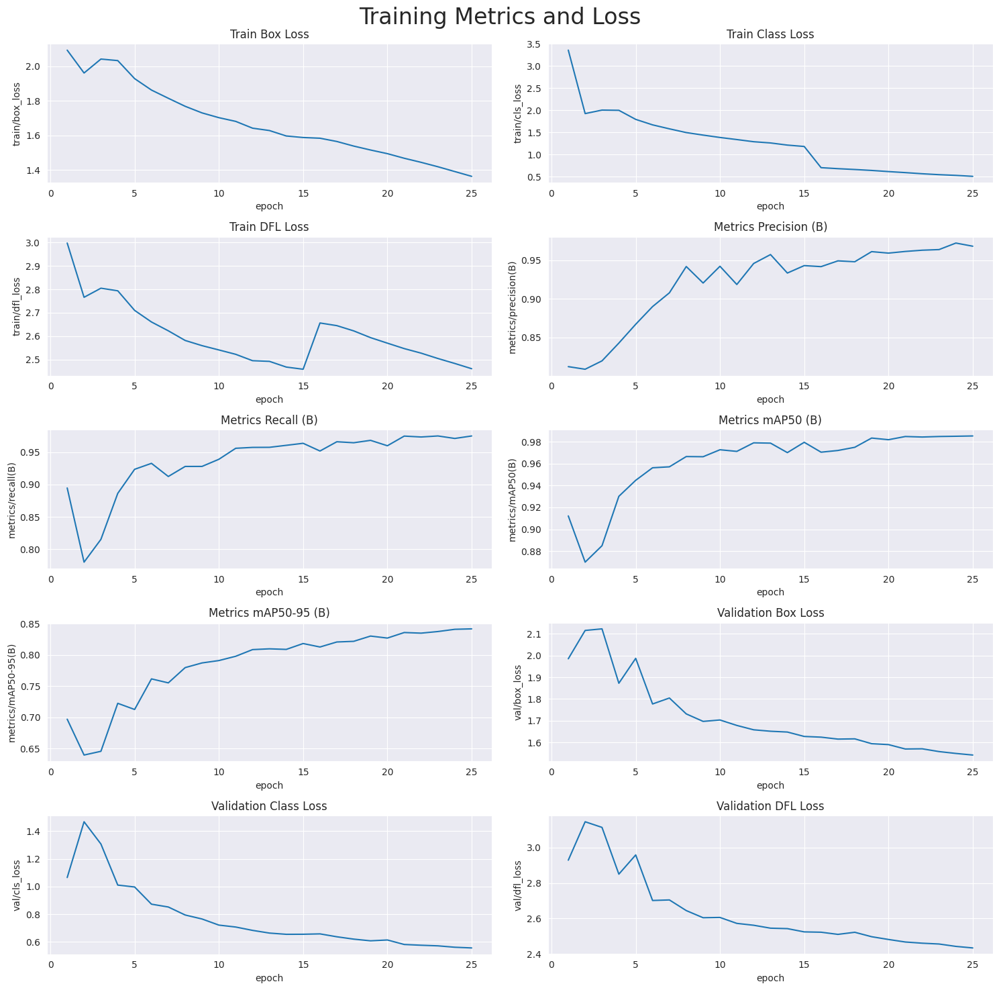

In [9]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [10]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.74 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10l summary (fused): 461 layers, 25,734,872 parameters, 0 gradients, 126.4 GFLOPs


val: Scanning /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test/labels... 2240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2240/2240 [00:09<00:00, 235.98it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 140/140 [01:16<00:00,  1.82it/s]


                   all       2240       3792      0.966      0.979      0.981      0.854
     c0 - Safe Driving        233        233      0.952      0.974      0.983      0.906
          c1 - Texting        257        257      0.988      0.996      0.993      0.934
c2 - Talking on the phone        275        275      0.996      0.996      0.995      0.859
c3 - Operating the Radio        262        262      0.996          1      0.995      0.964
         c4 - Drinking        290        290      0.983          1      0.995      0.925
  c5 - Reaching Behind        288        288      0.994          1      0.995      0.933
  c6 - Hair and Makeup        276        276      0.996      0.996      0.995      0.924
c7 - Talking to Passenger        202        202      0.929       0.97      0.981      0.927
      d0 - Eyes Closed        363        363      0.855      0.893       0.91      0.637
          d1 - Yawning         74         74      0.973      0.972      0.971      0.693
      d2 - No

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 31.2ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to runs/detect/val


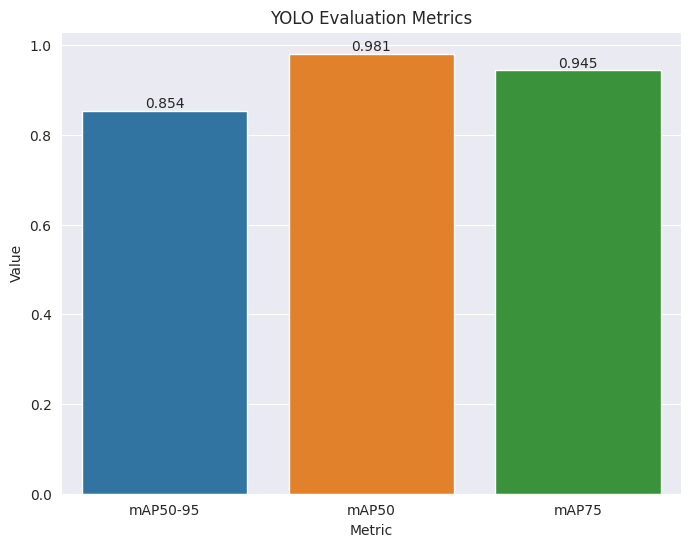

In [11]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
    
# Show the plot
plt.show()

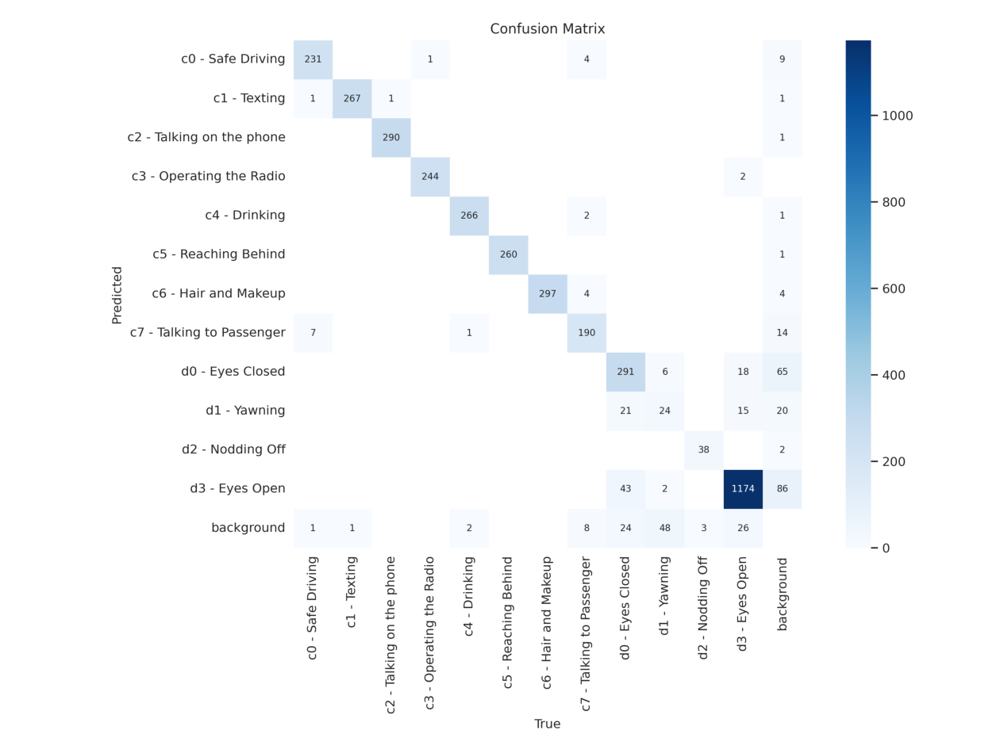

In [12]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

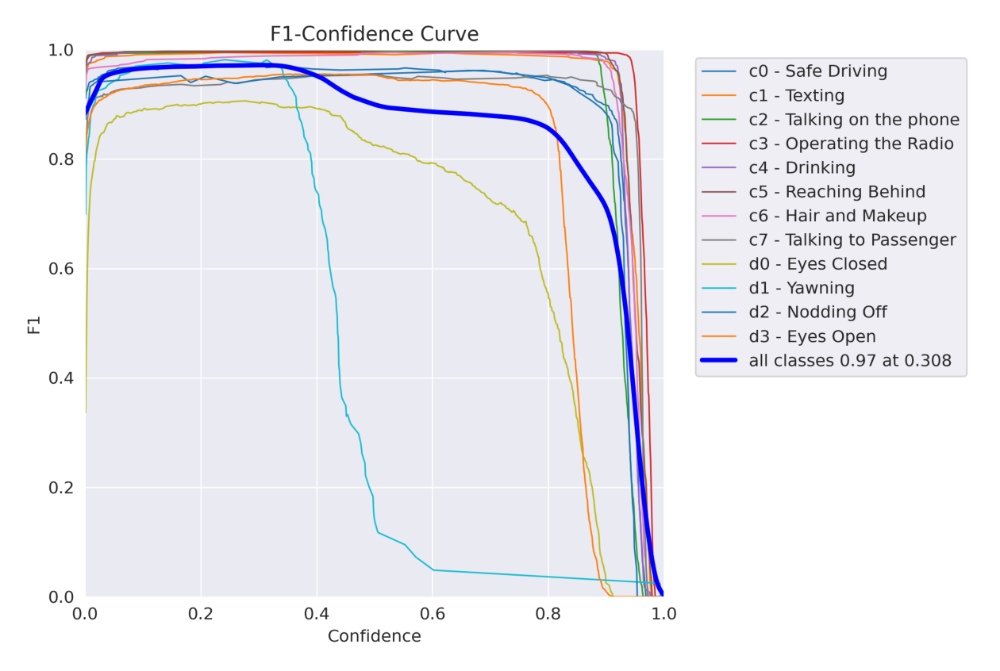

In [14]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/F1_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

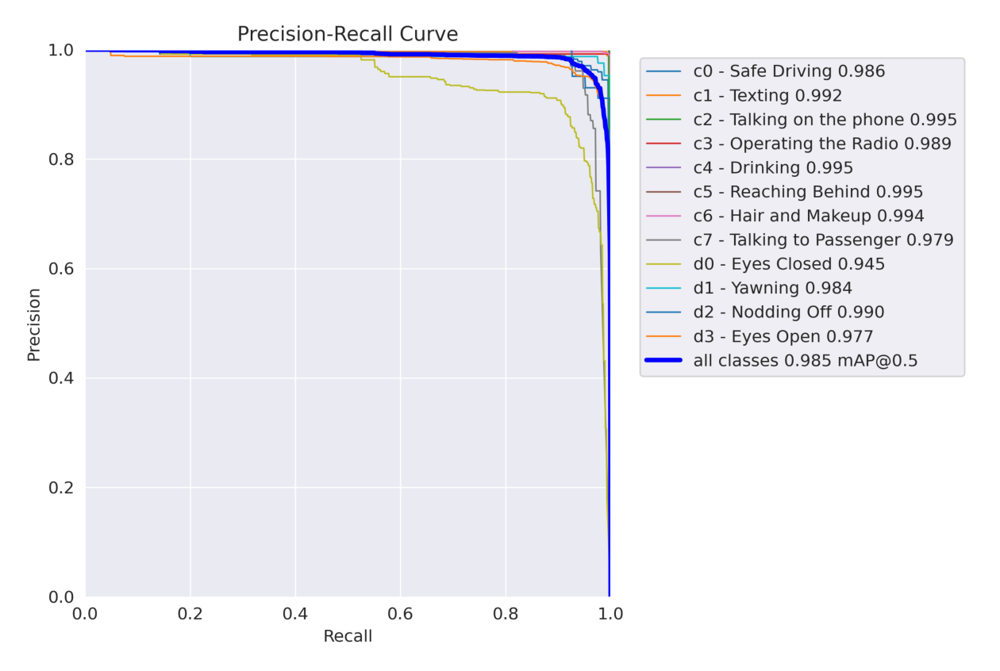

In [15]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/PR_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

In [16]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 480x640 1 c2 - Talking on the phone, 1 d3 - Eyes Open, 52.5ms
Speed: 3.0ms preprocess, 52.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 c4 - Drinking, 1 d3 - Eyes Open, 41.3ms
Speed: 2.0ms preprocess, 41.3ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 c2 - Talking on the phone, 1 d3 - Eyes Open, 34.8ms
Speed: 2.1ms preprocess, 34.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 c1 - Texting, 34.8ms
Speed: 2.3ms preprocess, 34.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 c4 - Drinking, 1 d3 - Eyes Open, 34.3ms
Speed: 1.9ms preprocess, 34.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 c1 - Texting, 1 d0 - Eyes Closed, 34.3ms
Speed: 1.8ms preprocess, 34.3ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 c4 - Drinking, 1 d3 - Eyes Open, 27.9ms
Speed: 1.8ms preprocess, 27.9ms in

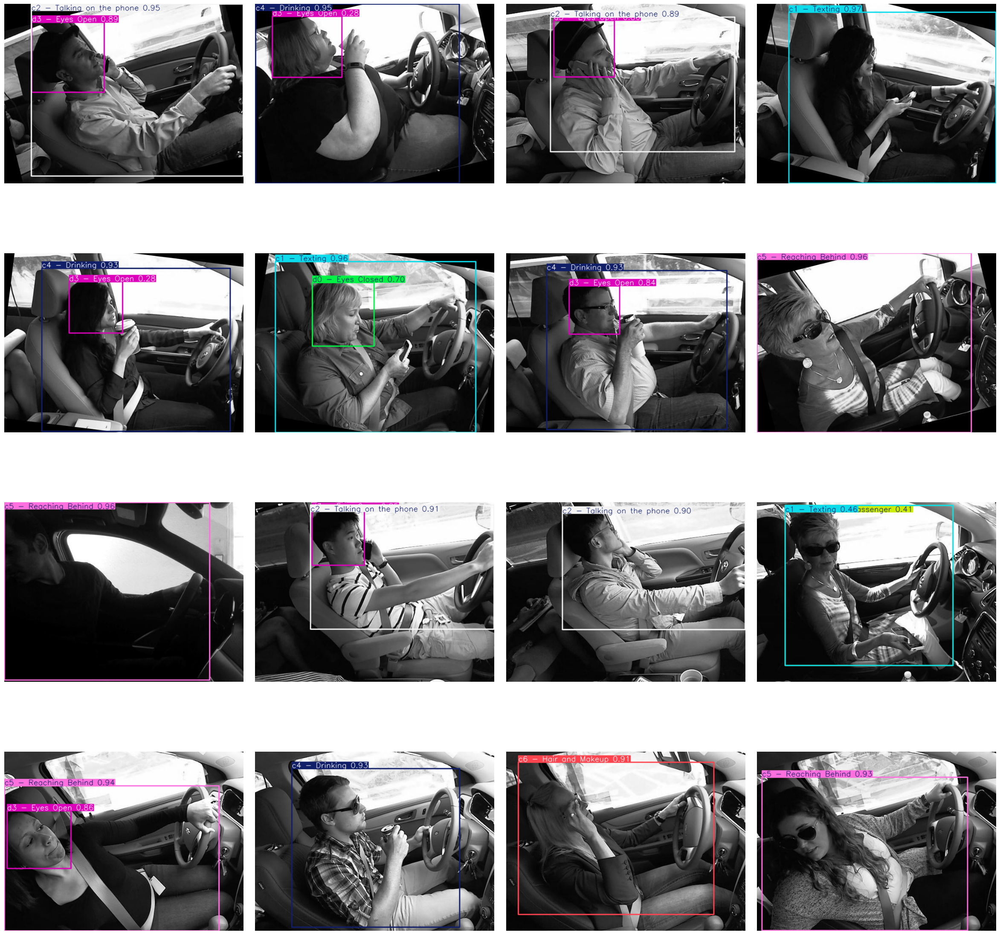

In [17]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/distracted-driving/Distracted Driving.v1i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(30,30))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)